# 🐶**End-to-end Dog breed identification project via Tensorflow.**

## 1. Problem Definition ⭐:
We have to build a Machine learning model which will identify the Dog breed based on the image given.

## 2. Data 📁:
The data is taken from Kaggle Dog Breed Identification competetion.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation 🧪:
For each image in the Test set , we'll have to predict probability for each of different breeds.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features 🗄:

Some information about the data:
* There are around 10000+ images in Training set (with labels).
* There are around 10000+ images in Test set. (We'll predict its labels).
* The Data contains Dog images (unstructured data) , so we'll use Deep Learning/transfer learning.
* There are 120 breeds of Dogs (this means there 120 different classes in the Data).


# Getting our workspace ready:
1. Importing Tensorflow ✅
2. Importing Tensorflow Hub ✅
3. Connecting to GPU ✅
4. Unzipping data (once) ✅

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
tf.__version__

'2.12.0'

In [ ]:
#unzipping the data
# !unzip "/content/drive/MyDrive/dog_vision_project/data/dog-breed-identification.zip" -d "/content/drive/MyDrive/dog_vision_project/data/"

# Getting Our Data ready (Turning it into Tensors):
For all our models to be trained on, our data should be in the numeric form . That is why we will have to convert the images into Tensors(numeric format).

## Checking labels of the data:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
labels_csv = pd.read_csv("drive/MyDrive/dog_vision_project/data/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

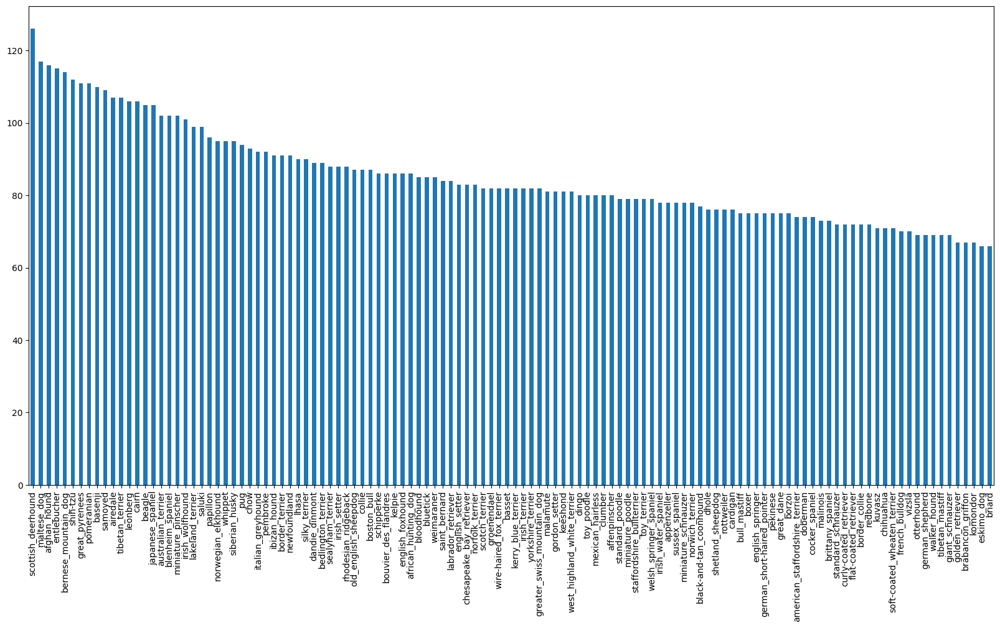

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

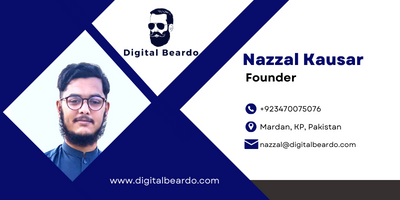

In [ ]:
#lets view an image
from IPython.display import Image
Image('drive/MyDrive/Blue White Minimalist Modern Financial Advisor Personal Email Signature.png')

In [ ]:
# create pathnames from image ID's
filename=["drive/MyDrive/dog_vision_project/data/train/" + fname + ".jpg" for fname in labels_csv['id']]
filename

['drive/MyDrive/dog_vision_project/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog_vision_project/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog_vision_project/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog_vision_project/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog_vision_project/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog_vision_project/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog_vision_project/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog_vision_project/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog_vision_project/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog_vision_project/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/dog_vision_project/data/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/dog_vision_project/data/train/0067dc3eab0b3c3ef04

In [ ]:
# check wether no of filenames matches no of images.
len(filename)


10222

In [ ]:
import os
if len(os.listdir('drive/MyDrive/dog_vision_project/data/train'))== len(filename):
  print("Length Matched!!!")
else:
  print("Length did not match :(")

Length Matched!!!


In [ ]:
os.listdir('drive/MyDrive/dog_vision_project/data/train')[:10]

['e6d9085fa22d76e3c089cfaea8f39479.jpg',
 'e78fc6d10f9d4646a50004e4ac74ea5c.jpg',
 'dfdd8b613bbe040dcd583ff89d71aeda.jpg',
 'e17462ffe48dffec8ff70325a6047957.jpg',
 'e8d0712b9ca47f77b333858183a38ef7.jpg',
 'e251a767dc8d07dcb4d33cbccb25cb90.jpg',
 'dc17313b78b555caab983c9270dd3ab9.jpg',
 'e17f3e7d3d1468c34643e60cb622e935.jpg',
 'e795a13bbfa8a72daeb315646f83068a.jpg',
 'e89f2129dc5830c7ba5114c7c79ee459.jpg']

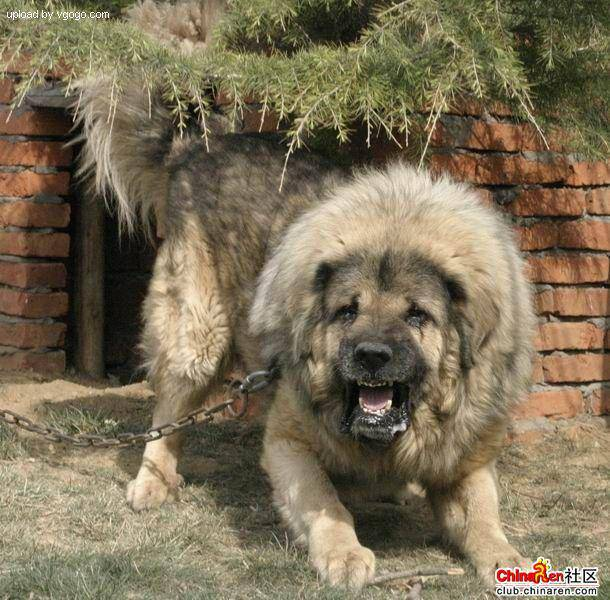

In [ ]:
Image(filename[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

## Preparing labels
Since we've got all our training images filepaths in a list, let's prepare our labels ✌
1. Convert them into booleans ✅
2. convert them into numbers so we can work with them easily ✅

In [ ]:

labels= labels_csv["breed"].to_numpy()
#We converted the labels from object dtye to a numpy array.
#Funbit: you can do it using following command too ;)
# labels=np.array(labels_csv["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
#Lets compare these labels to the number of filenames.
if len(labels)==len(filename):
  print("Length Matched!!!!")
else:
  print("Length did not match :(")

Length Matched!!!!


In [ ]:
# Find the unique labels
import numpy as np
unique_breeds= np.unique(labels)
unique_breeds[:10]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle'], dtype=object)

In [ ]:
labels[0]==unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels=[]
for label in labels:
  boolean_labels.append(label==unique_breeds)

In [ ]:
boolean_labels=np.array(boolean_labels)

In [ ]:
boolean_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
unique_breeds[19]

'boston_bull'

In [ ]:
labels[0]

'boston_bull'

Yayyyy!!!! So we have converted our array of labels into booleans. So it will be easy to convert them into tensors now.

## Creating our own validation set:
since the data from kaggle does not come with the validation set, so we'll create our own validation set.

In [ ]:
x=filename
y=boolean_labels

We will reduce the aomunt of samples as it will take lots of time. 😉

In [ ]:
NUM_IMAGES=1000 #@param (type:"slider", min:1000, max:10000, step:1000)

In [ ]:
#splitting the data:
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  random_state=42,
                                                  test_size=0.2)

In [ ]:
len(x_train), len(y_train), len(x_val), len(y_val)


(800, 800, 200, 200)

In [ ]:
x_train[:2], y_train[:2]

(['drive/MyDrive/dog_vision_project/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog_vision_project/data/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 array([[False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False

## Preprocessing Images:
We'll write a python function  to preprocess the images for us in the following steps:
1. Take an image filepath as an input
2. Use Tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) to Tensors.
4. Normalize the color channels(convert from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image.

In [ ]:
IMG_SIZE=224

def preprocess_image(filepath, IMG_SIZE=224):
  image = tf.io.read_file(filepath)
  image = tf.image.decode_jpeg(image, channels=3)
  image= tf.image.convert_image_dtype(image, tf.float32)
  image= tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning our data into batches

In [ ]:
# Lets get our data into a tuple of (image, label)
def get_image_label(filepath, label):
  image=preprocess_image(filepath)
  return(image, label)

In [ ]:
preprocess_image(x[42])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [ ]:
def create_batches(x, y=None, batch_size=32, test_ds=False, val_ds=False):
  '''
  This function creates batches of the Train, test and validation datasets.
  It also does some data shuffling on the required datasets.
  Also accepts test data as input(no labels)
  '''
  #lets deal the test data first
  if test_ds:
    print("Creating test batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x))) #no labels
    data_batch = data.map(preprocess_image).batch(batch_size)
    return data_batch

  elif val_ds:
    print("Creating validation batches.....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating Training batches....")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch


In [ ]:
# creating batches using the above function
train_data=  create_batches(x=x_train, y=y_train)
val_data = create_batches(x=x_val, y=y_val, val_ds=True)

Creating Training batches....
Creating validation batches.....


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Modeling


In [ ]:
INPUT_SHAPE=[None, 224, 224, 3]

OUTPUT_SHAPE=len(unique_breeds)

MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs and outputs and model ready to go so letsssss goooo.

Let's create a function which :
* Takes the input shape, output shape and the model we've chosen as parameter.
* Defines the layers in a Keras model in sequential fashion (do this first and then this and then that).
* Compiles the model(says it should be evaluated and improved)
* Builds the model (tells the model the shape it'll be getting).
* Returns the model.

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)
  model= tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output)
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer= tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  model.build(INPUT_SHAPE)
  return model

In [ ]:
model= create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions which monitors and alter the activity of a model.
we'll create two:
1. **Tensorboard:** which monitors the progress of the model.
2. **Early stopping:** Which will stop the model when its progress stops.



To build Tensorboard callback :
1. Load the tensorboard extension.
2. create callback which will save logs to a directory and pass it to model's `fit()` function.
3. Visualize training logs with `%tensorboard` magic function.


In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir= os.path.join('drive/MyDrive/dog_vision_project/data/logs',
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping= tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                 patience=3)

In [ ]:
def train_model():
  model= create_model()
  tensorboard= create_tensorboard_callback()

  model.fit(x=train_data,
            validation_data=val_data,
            validation_freq=1,
            epochs=100,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 127s 5s/step - loss: 4.6032 - accuracy: 0.0850 - val_loss: 3.4559 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 4s 150ms/step - loss: 1.6254 - accuracy: 0.6850 - val_loss: 2.1941 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 4s 141ms/step - loss: 0.5646 - accuracy: 0.9350 - val_loss: 1.7099 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2564 - accuracy: 0.9887 - val_loss: 1.5206 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 4s 163ms/step - loss: 0.1503 - accuracy: 0.9975 - val_loss: 1.4631 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 3s 128ms/step - loss: 0.1001 - accuracy: 0.9987 - val_loss: 1.3971 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================]

In [ ]:
%tensorboard --logdir drive/MyDrive/dog_vision_project/data/logs


<IPython.core.display.Javascript object>

In [ ]:
predictions=model.predict(val_data, verbose=1)

7/7 [==============================] - 2s 117ms/step


Lets use these predictions and convert them into labels.

In [ ]:
index=34
print(unique_breeds[np.argmax(predictions[index])])
print(np.max(predictions[index]))


pomeranian
0.082340606


Now lets unbatch the data and verify the predictions

In [ ]:
def unbatchify(data):
  """
  Unbatch the data and give labels and images
  """
  labels_=[]
  images_=[]

  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_

In [ ]:
def get_pred_label(predictions):
  return unique_breeds[np.argmax(predictions)]

In [ ]:
get_pred_label(predictions[10])

'papillon'

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
pred_labels= get_pred_label(predictions[0])

In [ ]:
pred_labels

'welsh_springer_spaniel'

In [ ]:
def plot_preds(probabilities, images, labels, n=1):
  pred_prob, true_label, image= probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.yticks([])
  plt.xticks([])

  if pred_label==true_label:
    color='green'
  else:
    color='red'

  plt.title(f"{pred_label} {np.max(pred_prob)}% {true_label}",
            color=color)

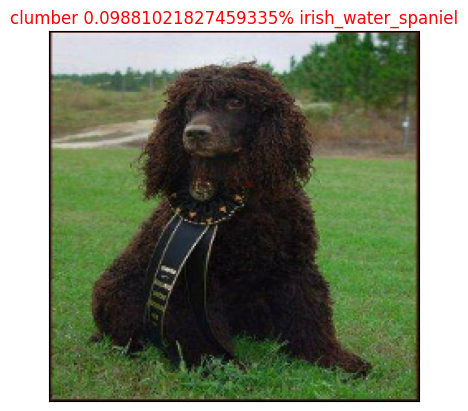

In [ ]:
i=1
while i<20:
  plot_preds(predictions, val_images, val_labels, n=i)
  i=i+1

Plotting the top 10 predictions

In [ ]:
def plot_pred_conf(pred_probs, labels, n=1):
  """
  plot the highest 10 predictions along with true labels for sample n
  """
  pred_prob , true_label= pred_probs[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels= unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass


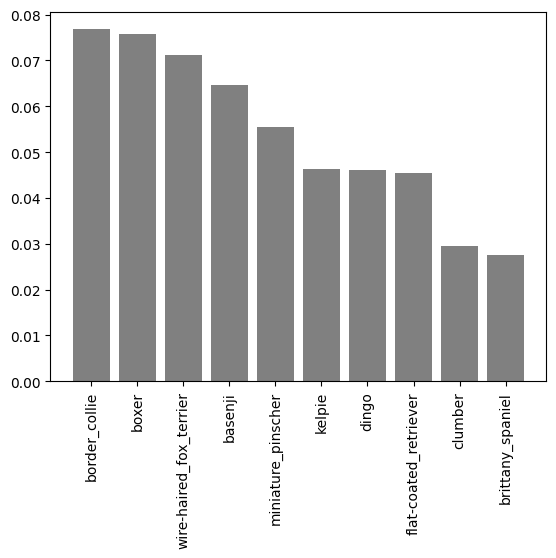

In [ ]:
plot_pred_conf(predictions, val_labels,
               n=150)

Seems the like the model is not predicting well, lets checkout some predictions and their values.

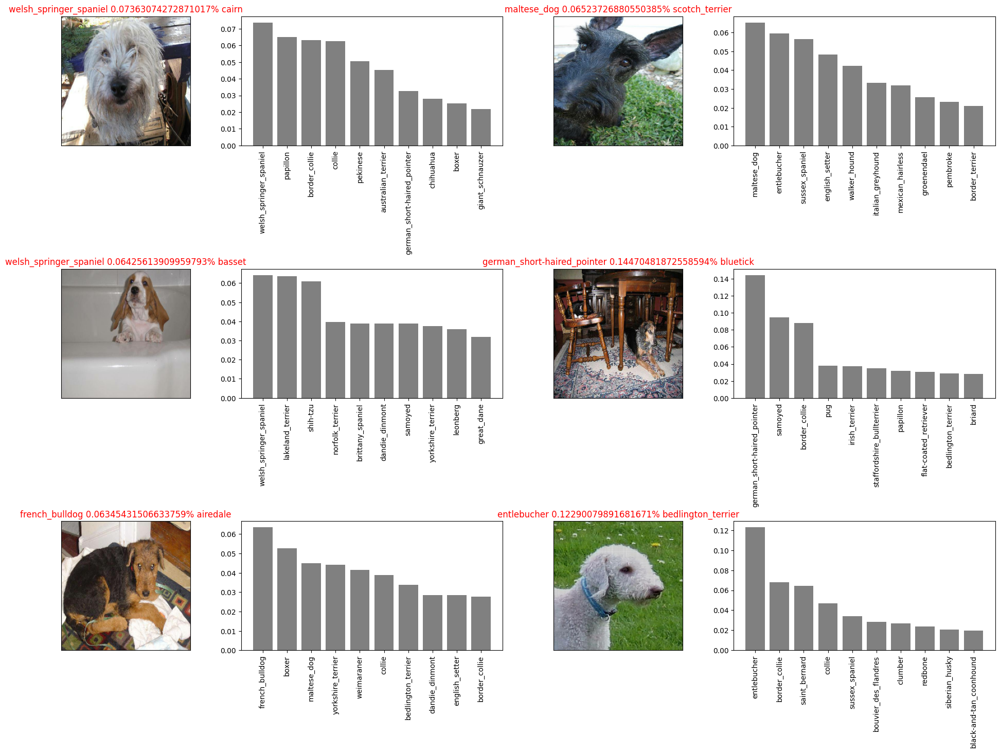

In [ ]:
i_multiplier=0
num_rows=3
num_cols=2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_preds(predictions,val_images,val_labels, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, n=i+i_multiplier)
  plt.tight_layout(pad=2.0)

plt.show()

In [ ]:
# create a function to save model
def save_model(model, suffix=None):
  #create a model directory pathname with current time
  model_dir=os.path.join("drive/MyDrive/dog_vision_project/data/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path= model_dir+"-"+ suffix + ".h5"
  print(f"saving model to{model_path}....")
  model.save(model_path)
  return model_path

In [ ]:
#create a function to load a trained model
def load_model(model_path):
  print(f"Loading model from {model_path}...")
  model= tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
full_data=create_batches(x=x, y=y)


Creating Training batches....


In [ ]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensorboard= create_tensorboard_callback()

In [ ]:
full_model_early_stopping= tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                           patience=3)

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
# full_model.fit(x=full_data,
#                epochs =100,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
# save_model(full_model, suffix='full_image_dataset-mobilenetv2-Adam')

In [ ]:
len(full_data)

320

## Making Predictions on the Test data
To make predictions on test data, let's:
1. Get the test image filenames.
2. convert them into test batches
3. Make predictions by passing it to our model.

In [ ]:
test_path= 'drive/MyDrive/dog_vision_project/data/test/'
test_filenames= [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
test_filenames[:10]

['drive/MyDrive/dog_vision_project/data/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e47de0441a48f2eff7c2faacd350ed06.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e458d6133dd1b436b047f86910f7fe34.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e1f9be3ecf0409189486c786ff4bd65a.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e29d2336a8559d96973c874c9c6c17c6.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e48f3d4f0514a07f4777a30f01d32ea9.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e1e7949f64ff3283a5dafa9d39199193.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e4cffb02169d9b46810d50c6b9eae28d.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e181bd9b192ab7b21b851a643c53c817.jpg',
 'drive/MyDrive/dog_vision_project/data/test/e6295bd4afe5ddf93a02cbd668819e9e.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_batches(x=test_filenames, test_ds=True)

Creating test batches....


In [ ]:
loaded_full_model= load_model('drive/MyDrive/dog_vision_project/data/models/20230425-080816-full_image_dataset-mobilenetv2-Adam.h5')

Loading model from drive/MyDrive/dog_vision_project/data/models/20230425-080816-full_image_dataset-mobilenetv2-Adam.h5...


In [ ]:
# test_predictions= loaded_full_model.predict(test_data,
#                                             verbose=1)

In [ ]:
# np.savetxt('drive/MyDrive/dog_vision_project/data/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
test_predictions= np.loadtxt('drive/MyDrive/dog_vision_project/data/preds_array.csv', delimiter=',')

In [ ]:
preds_df= pd.DataFrame(columns=["id"]+ list(unique_breeds))
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df[list(unique_breeds)]= test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5fa615e36dc3b2b3f554aa5097a6ece,3.178336e-09,7.248824e-10,1.726536e-08,4.336569e-10,2.694482e-06,7.176011e-10,2.426731e-07,4.390990e-04,3.405488e-06,...,1.305803e-03,2.306171e-05,8.667871e-09,1.818408e-11,4.957737e-07,2.932894e-07,7.761553e-08,2.425676e-07,1.416949e-06,5.212095e-07
1,e47de0441a48f2eff7c2faacd350ed06,4.820032e-06,6.128726e-05,2.628623e-08,1.818204e-09,1.432417e-10,4.095343e-05,1.476411e-07,6.726153e-05,1.711514e-09,...,2.593436e-10,5.064834e-11,1.905583e-11,1.060295e-04,1.993763e-09,6.615098e-06,1.029070e-03,1.078170e-06,8.549277e-07,2.429947e-08
2,e458d6133dd1b436b047f86910f7fe34,9.695643e-07,2.186028e-06,1.996686e-09,1.842727e-05,3.719742e-09,3.082290e-11,3.046474e-10,5.132835e-10,3.741550e-10,...,8.205374e-07,6.534240e-10,2.215573e-10,8.145627e-07,3.918023e-10,4.495723e-09,4.517707e-11,2.206681e-08,2.730021e-07,8.399538e-08
3,e1f9be3ecf0409189486c786ff4bd65a,9.727385e-08,9.337825e-12,8.150996e-09,1.815941e-11,4.842102e-11,2.237022e-07,9.994512e-08,1.244583e-06,5.144189e-10,...,1.284372e-06,1.266917e-04,1.126581e-09,1.488525e-11,3.417665e-09,5.119665e-08,3.051690e-09,2.287486e-08,9.681167e-10,3.738124e-07
4,e29d2336a8559d96973c874c9c6c17c6,3.696680e-07,7.350623e-08,4.019673e-08,6.021540e-12,7.171254e-09,3.408538e-12,1.172412e-08,1.998131e-09,3.364309e-07,...,2.722332e-09,1.013843e-08,1.903602e-10,6.327828e-08,4.753929e-11,2.323844e-09,1.991547e-01,9.330413e-09,8.607590e-05,1.348018e-08


## Making predictions on custom images
To make predictions on custom images, we have to:
* Get the filepaths of our own images.
* Turn filepaths into batches with `test_ds=True`.
* make prediction on batches by `predict()` method.
* convert prediction probs into pred labels.
* compare pred labels to custom images.

In [ ]:
custom_path = "drive/MyDrive/dog_vision_project/data/custom/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['drive/MyDrive/dog_vision_project/data/custom/download (3).jpeg',
 'drive/MyDrive/dog_vision_project/data/custom/download (2).jpeg',
 'drive/MyDrive/dog_vision_project/data/custom/download (1).jpeg',
 'drive/MyDrive/dog_vision_project/data/custom/download.jpeg']

In [ ]:
custom_data = create_batches(custom_image_paths, test_ds=True)

Creating test batches....


In [ ]:
custom_preds= loaded_full_model.predict(custom_data, verbose=1)

1/1 [==============================] - 2s 2s/step


In [ ]:
np.argmax(custom_preds[2])

94

In [ ]:
custom_images=[]

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)
custom_images

[array([[[1.        , 0.9333334 , 0.7294118 ],
         [1.        , 0.9345414 , 0.7306198 ],
         [1.        , 0.9392683 , 0.7353467 ],
         ...,
         [0.81579155, 0.6667719 , 0.6157915 ],
         [0.8063377 , 0.65731806, 0.60633767],
         [0.80392164, 0.654902  , 0.6039216 ]],
 
        [[1.        , 0.9337361 , 0.7322304 ],
         [1.        , 0.9349027 , 0.73339707],
         [1.        , 0.93946785, 0.7379622 ],
         ...,
         [0.82123286, 0.6736171 , 0.6208302 ],
         [0.81129366, 0.6641633 , 0.610891  ],
         [0.80875355, 0.6617472 , 0.6083509 ]],
 
        [[1.        , 0.9353117 , 0.74325985],
         [1.        , 0.93631655, 0.7442647 ],
         [1.        , 0.9402486 , 0.7481967 ],
         ...,
         [0.842525  , 0.70040286, 0.6405467 ],
         [0.8306866 , 0.690949  , 0.6287083 ],
         [0.82766116, 0.68853295, 0.6256828 ]],
 
        ...,
 
        [[0.66461825, 0.76071423, 0.505707  ],
         [0.66401964, 0.7601157 , 0.50510

In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
custom_pred_labels=[]
for i in range(len(custom_preds)):
  custom_pred_labels.append((get_pred_label(custom_preds[i])))

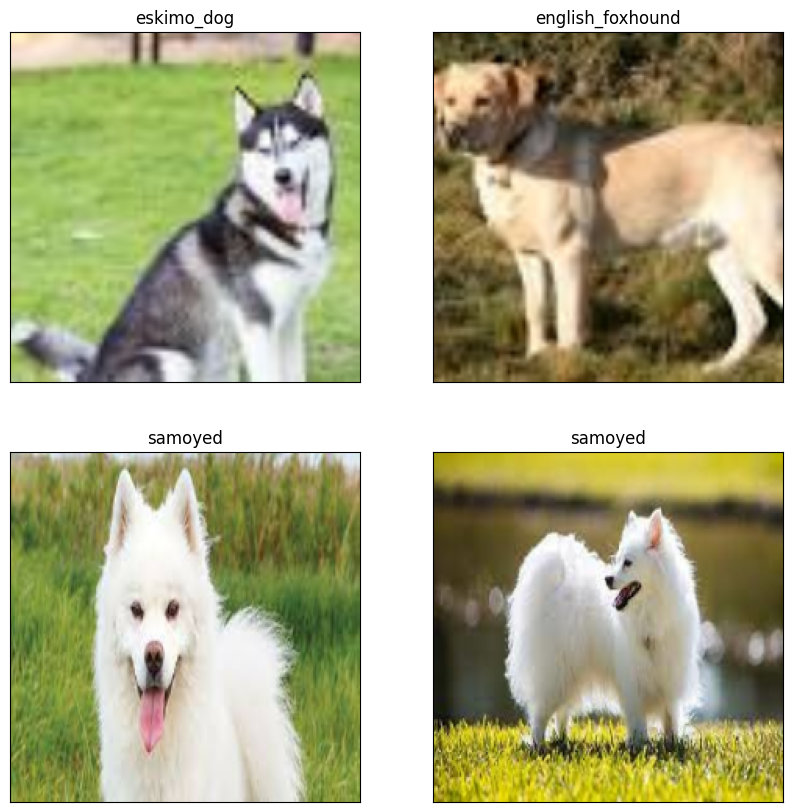

In [ ]:
plt.figure(figsize=(10,10))
for i , image in enumerate(custom_images):
  plt.subplot(2, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

***SO We HAVE FINISHED THE PROJECT!!!***